In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import keras
import tensorflow as tf    
import seaborn as sns
from keras import layers
from tensorflow.keras import regularizers
from keras.applications.inception_resnet_v2 import InceptionResNetV2
from keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications import DenseNet201
from keras.layers import Input,Dense, Activation, ZeroPadding2D, BatchNormalization, Flatten, Conv2D
from keras.layers import AveragePooling2D, MaxPooling2D,MaxPool2D, Dropout, GlobalMaxPooling2D, GlobalAveragePooling2D
from keras.layers import concatenate
from keras.models import Model,Sequential
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
from matplotlib.pyplot import imshow
from keras.preprocessing import image
from keras import applications
from keras.models import Sequential
import os,sys
import cv2
from keras.preprocessing.image import ImageDataGenerator,load_img,img_to_array

import warnings
warnings.simplefilter("ignore")

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
os.chdir("/content/drive/MyDrive/Colab Notebooks")

In [ ]:
!unzip dataset.zip -d dataset

Se han truncado las últimas 5000 líneas del flujo de salida.
  inflating: dataset/dataset/train/boxer/n02108089_2815.jpg  
  inflating: dataset/dataset/train/boxer/n02108089_2917.jpg  
  inflating: dataset/dataset/train/boxer/n02108089_2953.jpg  
  inflating: dataset/dataset/train/boxer/n02108089_3028.jpg  
  inflating: dataset/dataset/train/boxer/n02108089_3162.jpg  
  inflating: dataset/dataset/train/boxer/n02108089_3248.jpg  
  inflating: dataset/dataset/train/boxer/n02108089_3258.jpg  
  inflating: dataset/dataset/train/boxer/n02108089_3365.jpg  
  inflating: dataset/dataset/train/boxer/n02108089_3412.jpg  
  inflating: dataset/dataset/train/boxer/n02108089_3547.jpg  
  inflating: dataset/dataset/train/boxer/n02108089_3557.jpg  
  inflating: dataset/dataset/train/boxer/n02108089_3669.jpg  
  inflating: dataset/dataset/train/boxer/n02108089_3899.jpg  
  inflating: dataset/dataset/train/boxer/n02108089_4002.jpg  
  inflating: dataset/dataset/train/boxer/n02108089_4042.jpg  
  inflati

# Visualización de imágenes

In [ ]:
path_train = './dataset/dataset/train'
path_test = './dataset/dataset/test'
#almacenamos todo el listado de carpetas donde estan las fotos de cada raza
breeds = os.listdir(path_train)
#visualizamos el resultado
print("Lista de razas = ",breeds,"\n\nNúmero de razas = ", len(breeds)) 

Lista de razas =  ['afghan_hound', 'airedale', 'american_staffordshire_terrier', 'appenzeller', 'basset', 'beagle', 'bedlington_terrier', 'border_collie', 'borzoi', 'bouvier_des_flandres', 'boxer', 'brabancon_griffon', 'briard', 'brittany_spaniel', 'cardigan', 'chihuahua', 'chow', 'cocker_spaniel', 'doberman', 'english_foxhound', 'english_springer', 'flat_coated_retriever', 'french_bulldog', 'german_shepherd', 'german_short_haired_pointer', 'golden_retriever', 'great_dane', 'great_pyrenees', 'greater_swiss_mountain_dog', 'groenendael', 'ibizan_hound', 'irish_setter', 'italian_greyhound', 'komondor', 'labrador_retriever', 'leonberg', 'malinois', 'miniature_pinscher', 'miniature_schnauzer', 'papillon', 'pekinese', 'pembroke', 'pomeranian', 'pug', 'rottweiler', 'saint_bernard', 'saluki', 'samoyed', 'schipperke', 'scottish_deerhound', 'shetland_sheepdog', 'shih_tzu', 'siberian_husky', 'sussex_spaniel', 'toy_poodle', 'toy_terrier', 'vizsla', 'weimaraner', 'whippet', 'yorkshire_terrier'] 

N

Text(0.5, 1.0, 'Dog Breeds')

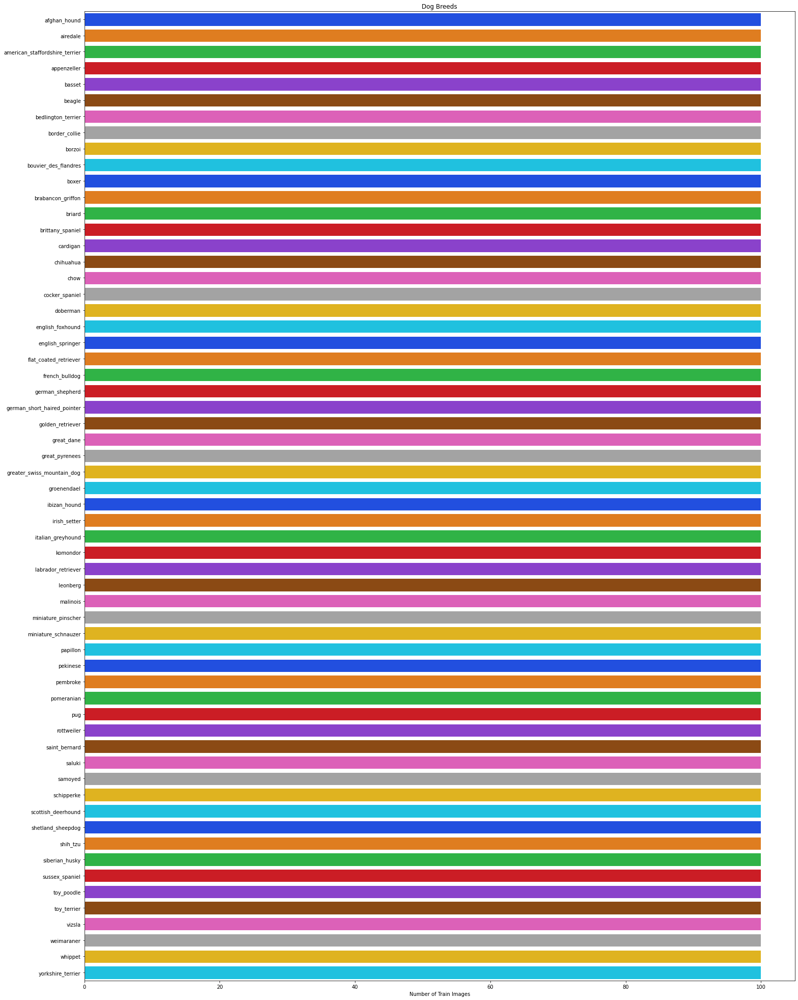

In [ ]:
# Visualizamos el balanceo de imágenes en la carpeta de entrenamiento
data_img_train= []
for i in breeds:
    data_img_train.append(len(os.listdir(path_train+ "/" + i)))

fig, ax = plt.subplots()
fig.set_size_inches(25,35)
sns.set_style("whitegrid")

ax = sns.barplot(x = data_img_train, y = breeds, palette="bright")
ax.set_yticklabels(ax.get_yticklabels(),fontsize = 10)
ax.set(xlabel='Number of Train Images')
ax.set_title('Dog Breeds')


Text(0.5, 1.0, 'Dog Breeds')

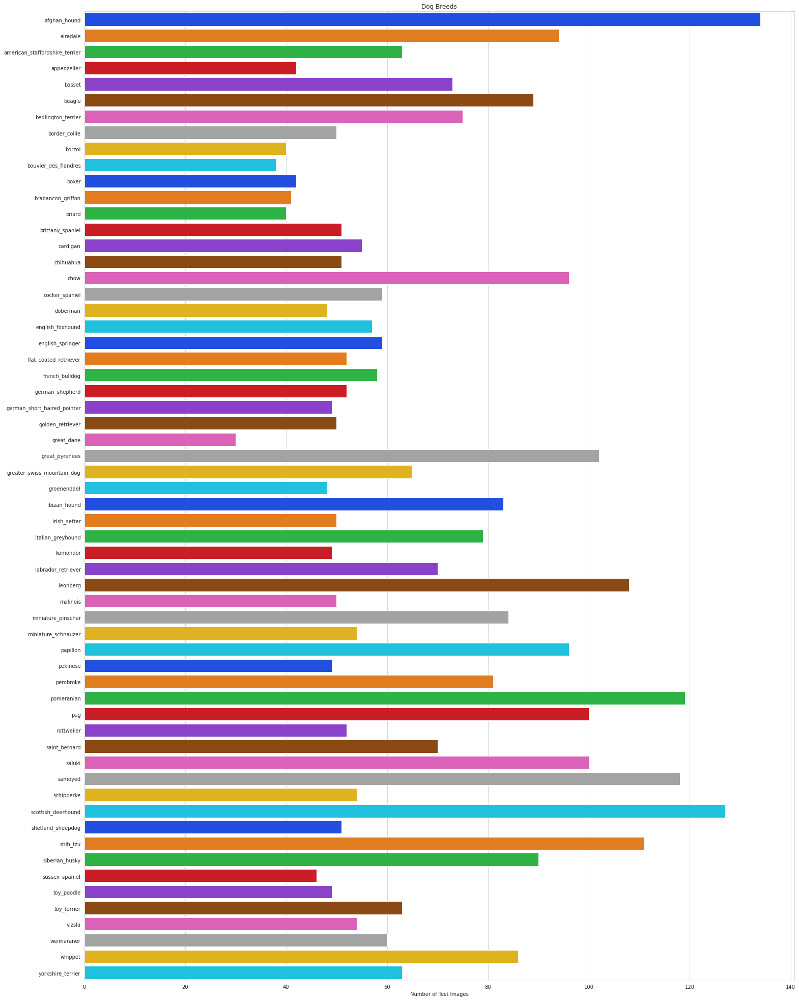

In [ ]:
# Visualizamos el balanceo de imágenes en la carpeta de test
data_img_test= []
for i in breeds:
    data_img_test.append(len(os.listdir(path_test+ "/" + i)))

fig, ax = plt.subplots()
fig.set_size_inches(25,35)
sns.set_style("whitegrid")

ax = sns.barplot(x = data_img_test, y = breeds, palette="bright")
ax.set_yticklabels(ax.get_yticklabels(),fontsize = 10)
ax.set(xlabel='Number of Test Images')
ax.set_title('Dog Breeds')

Muestra de imagenes cargadas en test


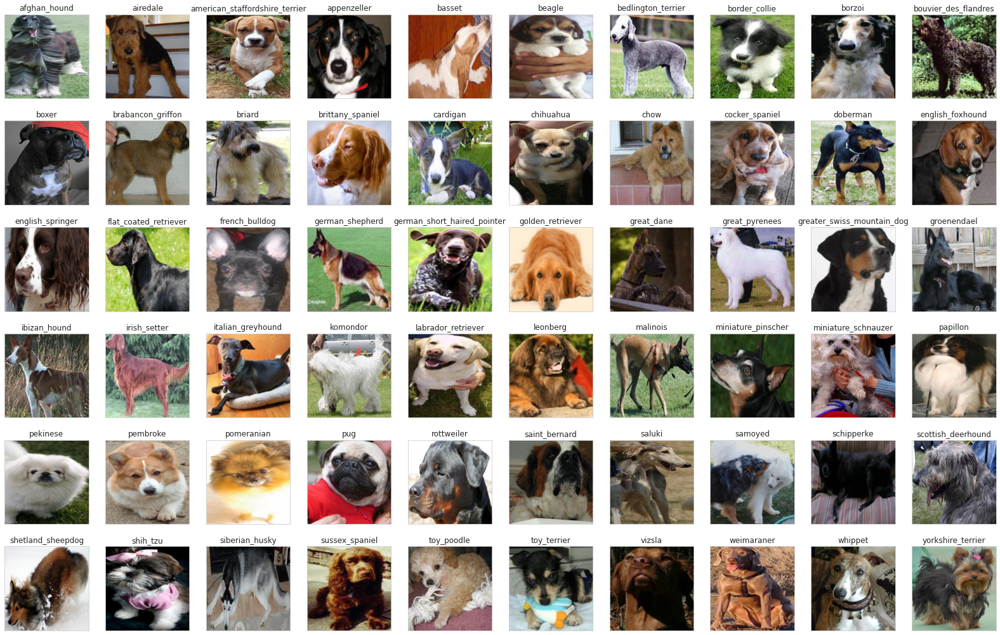

Muestra de imagenes cargadas en train


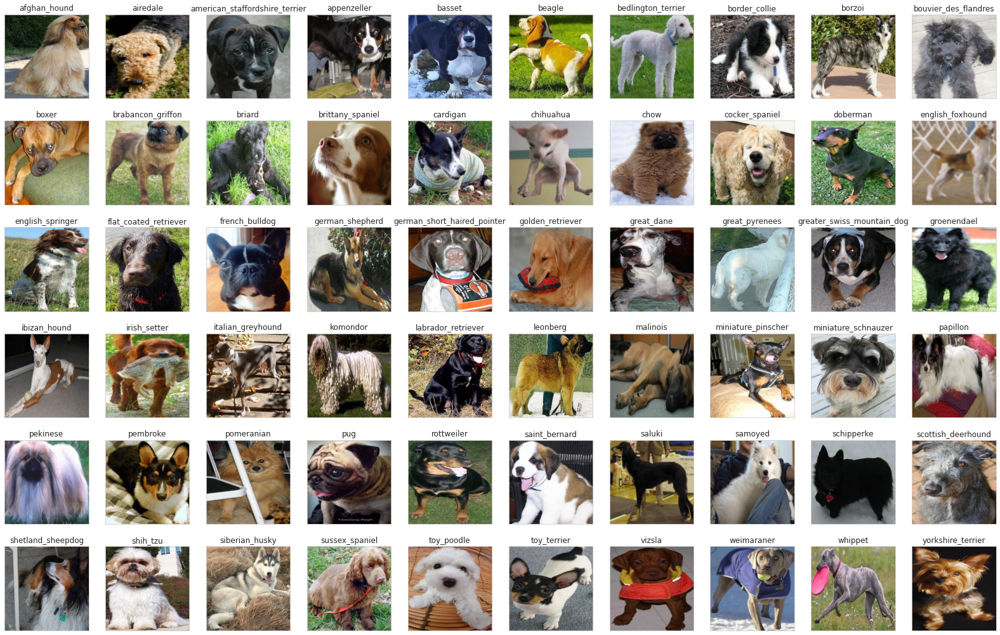

In [ ]:
# Mostrar una imagen de cada raza en train y test
def mostrarImagenes(lista, carpeta):
  plt.figure(figsize=(28,18))
  for i in enumerate(lista):
      plt.subplot(6,10,i[0]+1)
      plt.xticks([])
      plt.yticks([])
      image = os.listdir(carpeta+ "/" + i[1])[0]
      image = carpeta+ "/" +i[1]+'/'+image
      img = plt.imread(image)
      plt.imshow(img)
      plt.title('{}'.format(i[1]))
  plt.show()

print("Muestra de imagenes cargadas en test")
mostrarImagenes(breeds, path_test)
print("Muestra de imagenes cargadas en train")
mostrarImagenes(breeds, path_train)

# Preprocesamiento de imagenes

In [ ]:
# Utilizamos Image Data Generator.
bs = 64
train_datagen = ImageDataGenerator(
    rescale=1./255, 
    validation_split=0.3,
    width_shift_range=0.1,      
    height_shift_range=0.1,     
    rotation_range=40,          
    zoom_range = 0.1,)

test_datagen = ImageDataGenerator(rescale=1./255)

# Conjuntos de entrenamiento, test y validación

In [ ]:
# Creamos los conjuntos de entrenamiento, test y validación
train_generator = train_datagen.flow_from_directory(
        directory = path_train ,
        target_size=(224,224),
        color_mode = 'rgb', 
        batch_size=bs,
        class_mode='categorical',
        shuffle=True,
        subset = 'training',
        seed= 42)

valid_generator = train_datagen.flow_from_directory(
        directory= path_train,
        target_size=(224,224),
        color_mode = 'rgb', 
        batch_size=bs,
        class_mode='categorical',
        shuffle=True,
        subset = 'validation')

test_generator = test_datagen.flow_from_directory(
    directory=path_test,
    target_size=(224, 224),
    color_mode="rgb",
    batch_size=bs,
    class_mode="categorical",
    shuffle=False,
    seed=42
)

Found 4200 images belonging to 60 classes.
Found 1800 images belonging to 60 classes.
Found 4069 images belonging to 60 classes.


In [ ]:
labels = (train_generator.class_indices)
labels = dict((v,k) for k,v in labels.items())
print(labels)

{0: 'afghan_hound', 1: 'airedale', 2: 'american_staffordshire_terrier', 3: 'appenzeller', 4: 'basset', 5: 'beagle', 6: 'bedlington_terrier', 7: 'border_collie', 8: 'borzoi', 9: 'bouvier_des_flandres', 10: 'boxer', 11: 'brabancon_griffon', 12: 'briard', 13: 'brittany_spaniel', 14: 'cardigan', 15: 'chihuahua', 16: 'chow', 17: 'cocker_spaniel', 18: 'doberman', 19: 'english_foxhound', 20: 'english_springer', 21: 'flat_coated_retriever', 22: 'french_bulldog', 23: 'german_shepherd', 24: 'german_short_haired_pointer', 25: 'golden_retriever', 26: 'great_dane', 27: 'great_pyrenees', 28: 'greater_swiss_mountain_dog', 29: 'groenendael', 30: 'ibizan_hound', 31: 'irish_setter', 32: 'italian_greyhound', 33: 'komondor', 34: 'labrador_retriever', 35: 'leonberg', 36: 'malinois', 37: 'miniature_pinscher', 38: 'miniature_schnauzer', 39: 'papillon', 40: 'pekinese', 41: 'pembroke', 42: 'pomeranian', 43: 'pug', 44: 'rottweiler', 45: 'saint_bernard', 46: 'saluki', 47: 'samoyed', 48: 'schipperke', 49: 'scotti

# Modelo

In [ ]:
porcDrop = 0.5
tasaApr = 0.0001
epocas = 20

In [ ]:
# Visualizamos el modelo que vamos a usar para el entrenamiento
model = InceptionResNetV2()
model.summary()

225222656/225209952 [==============================] - 3s 0us/step
Model: "inception_resnet_v2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 299, 299, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 149, 149, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 149, 149, 32  96         ['conv2d[0][0]']                 
 alization)  

In [ ]:
InceptV2_model = InceptionResNetV2(input_shape=(224,224,3),include_top=False,weights='imagenet')

219070464/219055592 [==============================] - 2s 0us/step


In [ ]:
for layer in InceptV2_model.layers:
  layer.trainable = False

In [ ]:
my_model = Sequential()
my_model.add(InceptV2_model) 
my_model.add(GlobalAveragePooling2D())
my_model.add(Dense(units=1024,activation="relu"))
my_model.add(Dropout(rate=porcDrop))
my_model.add(Dense(units=60, activation="softmax"))

In [ ]:
# Optimizador 
my_model.compile(optimizer = Adam(tasaApr), loss= "categorical_crossentropy", metrics= ['accuracy'])

In [ ]:
# Agregamos los callback
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.callbacks import ReduceLROnPlateau

checkpointer = ModelCheckpoint(filepath='/content/drive/MyDrive/Colab Notebooks', verbose=1, save_best_only=True, monitor='val_accuracy', mode='max')
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=0.000001)

In [ ]:
# Entrenar modelo
res_train = my_model.fit(train_generator, validation_data=valid_generator, epochs=epocas, callbacks=[reduce_lr, checkpointer], verbose=2) 

Epoch 1/20

Epoch 00001: val_accuracy improved from -inf to 0.90556, saving model to /content/drive/MyDrive/Colab Notebooks
INFO:tensorflow:Assets written to: /content/drive/MyDrive/Colab Notebooks/assets
66/66 - 249s - loss: 0.4545 - accuracy: 0.8826 - val_loss: 0.3329 - val_accuracy: 0.9056 - lr: 1.0000e-04 - 249s/epoch - 4s/step
Epoch 2/20

Epoch 00002: val_accuracy improved from 0.90556 to 0.91333, saving model to /content/drive/MyDrive/Colab Notebooks
INFO:tensorflow:Assets written to: /content/drive/MyDrive/Colab Notebooks/assets
66/66 - 251s - loss: 0.3845 - accuracy: 0.8943 - val_loss: 0.3151 - val_accuracy: 0.9133 - lr: 1.0000e-04 - 251s/epoch - 4s/step
Epoch 3/20

Epoch 00003: val_accuracy did not improve from 0.91333
66/66 - 112s - loss: 0.3690 - accuracy: 0.8933 - val_loss: 0.3441 - val_accuracy: 0.8961 - lr: 1.0000e-04 - 112s/epoch - 2s/step
Epoch 4/20

Epoch 00004: val_accuracy did not improve from 0.91333
66/66 - 110s - loss: 0.3500 - accuracy: 0.8986 - val_loss: 0.3519 

In [ ]:
# Descargar modelo
my_model.save("modeloInception.h5")

# Evaluamos el modelo

In [ ]:
res_train.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])

In [ ]:
res_test = my_model.evaluate(test_generator, verbose=1)

64/64 [==============================] - 46s 710ms/step - loss: 0.1371 - accuracy: 0.9565


In [ ]:
res_valid = my_model.evaluate(valid_generator, verbose=1)

29/29 [==============================] - 32s 1s/step - loss: 0.3247 - accuracy: 0.9067


In [ ]:
print('Test loss:', res_test[0])
print('Test accuracy:', res_test[1])

Test loss: 0.13709430396556854
Test accuracy: 0.9565003514289856


In [ ]:
print('Validación loss:', res_train.history['val_loss'])
print('Validación accuracy:', res_train.history['val_accuracy'])

Validación loss: [0.3328700363636017, 0.3151252567768097, 0.3440561592578888, 0.3518986403942108, 0.33540838956832886, 0.34432870149612427, 0.33750680088996887, 0.2863532304763794, 0.3175252377986908, 0.33834221959114075, 0.30786263942718506, 0.340606153011322, 0.31248024106025696, 0.3075207769870758, 0.33704081177711487, 0.3192434310913086, 0.31573420763015747, 0.32456204295158386, 0.3147214651107788, 0.32349324226379395]
Validación accuracy: [0.9055555462837219, 0.9133333563804626, 0.8961111307144165, 0.8955555558204651, 0.9005555510520935, 0.8955555558204651, 0.9016666412353516, 0.9177777767181396, 0.9061111211776733, 0.8999999761581421, 0.9122222065925598, 0.8999999761581421, 0.9077777862548828, 0.9044444561004639, 0.9055555462837219, 0.9077777862548828, 0.9061111211776733, 0.9083333611488342, 0.9088888764381409, 0.9055555462837219]


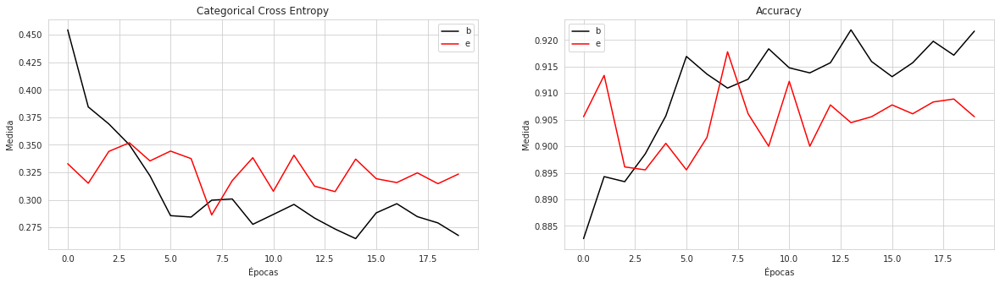

In [ ]:
fig, ejes = plt.subplots(nrows=1, ncols=2, figsize=(20,5))
ejes[0].plot(res_train.history['loss'],color='black', label='loss')
ejes[0].plot(res_train.history['val_loss'],color='red', label='val_loss')
ejes[0].set_title("Categorical Cross Entropy")
ejes[0].set_xlabel("Épocas")
ejes[0].set_ylabel("Medida")
ejes[0].legend('best')

ejes[1].plot(res_train.history['accuracy'],color='black', label='accuracy')
ejes[1].plot(res_train.history['val_accuracy'],color='red', label='val_accuracy')
ejes[1].set_title("Accuracy")
ejes[1].set_xlabel("Épocas")
ejes[1].set_ylabel("Medida")
ejes[1].legend('best')

# Predicción con el conjunto de test

In [ ]:
# Predict the label of the test_generator
salidaPredicha = my_model.predict(test_generator)

salidaPredicha = np.argmax(salidaPredicha,axis=1)

# Map the label
labels = (test_generator.class_indices)
labels = dict((v,k) for k,v in labels.items())
salidaPredicha = [labels[k] for k in salidaPredicha]

y_true = [labels[k] for k in test_generator.classes]

# Matriz de confusión

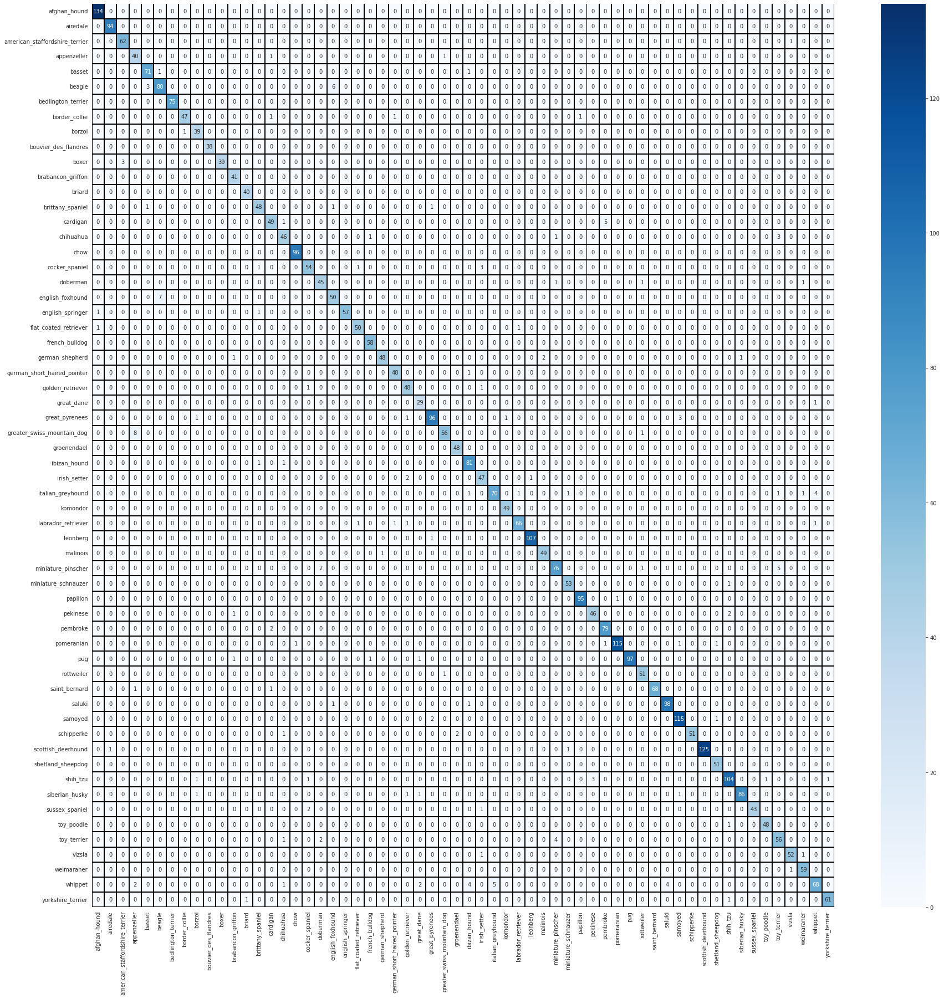

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cf_matrix = confusion_matrix(y_true, salidaPredicha)

cf_matrix = pd.DataFrame(cf_matrix, index=breeds, columns=breeds)

plt.figure(figsize = (30,30))
sns.heatmap(cf_matrix,cmap= "Blues", linecolor = 'black' , linewidth = 1 , annot = True, fmt='')
plt.savefig('/content/drive/MyDrive/Colab Notebooks/matrix_scatter.png', dpi=300)
plt.show()

# Informe de clasificación

In [ ]:
from sklearn.metrics import classification_report

report = classification_report(y_true, salidaPredicha, target_names = breeds)
print(report)

                                precision    recall  f1-score   support

                        beagle       0.99      1.00      1.00       134
                        basset       0.99      1.00      0.99        94
                      papillon       0.90      0.97      0.93        63
                      pekinese       0.80      0.98      0.88        42
                  afghan_hound       0.95      0.97      0.96        73
                     chihuahua       0.91      0.89      0.90        89
american_staffordshire_terrier       1.00      1.00      1.00        75
            bedlington_terrier       0.98      0.92      0.95        50
                        saluki       0.97      0.97      0.97        40
                      airedale       1.00      1.00      1.00        38
                        borzoi       1.00      0.90      0.95        42
              english_foxhound       0.91      1.00      0.95        41
                cocker_spaniel       0.95      1.00      0.98  

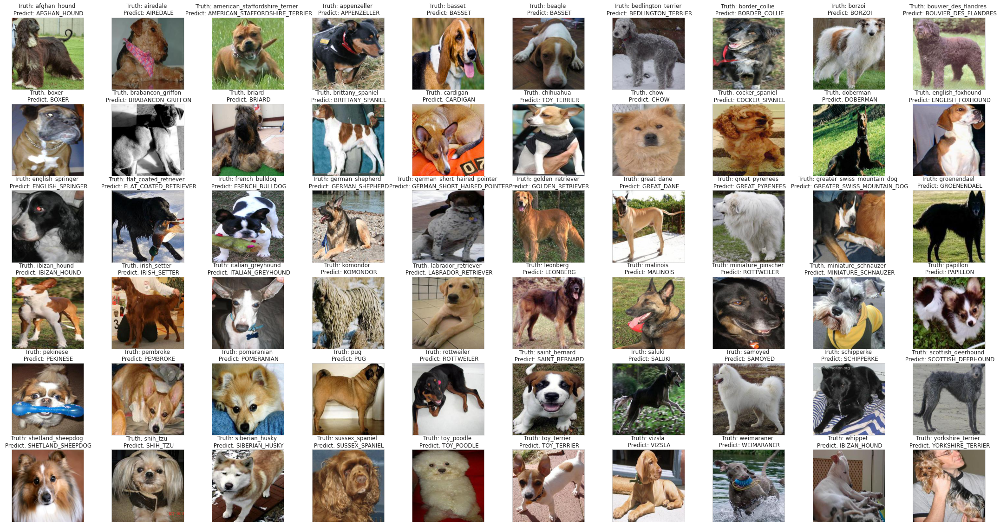

In [ ]:
from keras.preprocessing.image import load_img, img_to_array
# Mostrar una imagen de cada raza
plt.figure(figsize=(38,20))
for i in enumerate(breeds):
    plt.subplot(6,10,i[0]+1)
    plt.xticks([])
    plt.yticks([])
    image = os.listdir(path_test+ "/" + i[1])[15]
    image = path_test+ "/" +i[1]+'/'+ image

    img = plt.imread(image)
    plt.imshow(img)


    img1=load_img(image,target_size=(224,224,3))
    img1=img_to_array(img1)
    img1 =img1/255.0
    img1=np.expand_dims(img1,[0])
    preds=np.argmax(my_model.predict(img1), axis=-1)

    plt.title('Truth: {} \n Predict: {}'.format(i[1], labels[preds[0]].upper()))
plt.show()

# Prueba real

In [ ]:
# Función que nos diga el porcentaje de la raza de perro que puede ser
labels = (train_generator.class_indices)
labels = dict((v,k) for k,v in labels.items())
def identification(location):
    global key
    global probabilidad
    img=load_img(location,target_size=(224,224,3))
    img=img_to_array(img)
    img=img/255.0
    img=np.expand_dims(img,[0])
    answer=np.argmax(my_model.predict(img), axis=-1)
    probability=round(np.max(my_model.predict(img)*100),2)
    key = labels[answer[0]]
    probabilidad = str(probability)+'% de que la raza de este perro sea: '+key.replace("_", " ").title()
    print(probability,"% de que la raza de este perro sea:",key.replace("_", " ").title())
    #Almacenamos en una variable global el resultado de la raza predicha
    

99.49 % de que la raza de este perro sea: Golden Retriever


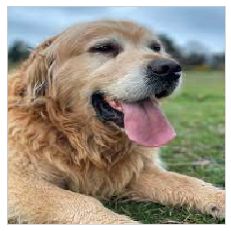

In [ ]:
#almacenamos en una variable la imagen a cotejar
dog = "/content/drive/MyDrive/Colab Notebooks/Proyecto IA/pruebagolden.jpg"
picture = load_img(dog,target_size=(224,224,3))
plt.xticks([])
plt.yticks([])
plt.imshow(picture)
identification(dog)

# Información de la raza

In [ ]:
#Leemos los datos del archivo excel donde hemos recopilado todos las métricas de los 10 sitios elegidos y lo almacenamos en una variable de tipo dataframe
dfBreeds = pd.read_excel('/content/drive/MyDrive/Colab Notebooks/Proyecto IA/24-Patricia-Info-Razas-Purina.xlsx', header = 'infer', sheet_name='Hoja1')
dfBreeds.head(5)

,Raza,Descripción,Origen,Personalidad,Salud,Ejercicio,Nutrición,Aseo
0,Giant Schnauzer,El Schnauzer gigante es un perro grande e impo...,El schnauzer gigante procede de un perro tipo ...,"A pesar de su aspecto fuerte e imponente, tien...","Al igual que muchas otras razas, el schnauzer ...",Este schnauzer necesita más de dos horas diari...,"Los perros de razas grandes, además de tener u...",Examina el manto a diario después del paseo y ...
1,Golden Retriever,Famoso por su pelaje dorado y brillante de lon...,Sir Dudley Marjoribanks (Lord Tweedmouth) tení...,El golden es un perro amable y equilibrado que...,"Como sucede con muchas razas, el golden retrie...",Los golden adultos necesitan una cantidad razo...,"Los perros de razas grandes, además de tener u...","Dada la densidad del pelaje, deberás cepillar ..."
2,Gordon Setter,El Setter escocés es un perro grande de pecho ...,Los orígenes del setter escocés se remontan al...,Es un perro amable y sensible que constituye u...,"Al igual que muchas otras razas, el setter esc...",Este perro se crio para tener fuerza y resiste...,"Los perros de razas grandes, además de tener u...","Al ser un perro de pelo semilargo, el setter e..."
3,Great Dane,El Gran Danés es un perro de tamaño muy grande...,En tumbas egipcias de 2200 a. C. se han visto ...,El gran danés es un perro cariñoso. Puede sent...,El gran danés es propenso a varios problemas e...,Un adulto sano necesitará alrededor de dos hor...,"Los perros de raza gigante, además de un apeti...","El pelaje corto, liso y denso del gran danés n..."
4,Great Pyrenees,"Este perro tiene un aspecto muy potente y, a l...","Originarios de los Pirineos, la cadena montaño...",El perros de montaña de los Pirineos suele ser...,"Este perro es, en general, una raza resistente...",Los cachorros deben ejercitarse de forma muy g...,"Los perros de raza gigante, además de un apeti...",Tendrás que peinar o cepillar al perro de una ...


In [ ]:
probabilidad

'99.49% de que la raza de este perro sea: Golden Retriever'

In [ ]:
key

'golden_retriever'

In [ ]:
#Leemos la foto de la raza predicha
#La key tiene que venir de arriba
imagen_resultado = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Proyecto IA/24-Patricia-Fotos-Razas-Purina/'+key+'.jpg')    
imagen_resultado = cv2.cvtColor(imagen_resultado, cv2.COLOR_BGR2RGB)

In [ ]:
#Extraemos la info de la raza predicha de la excel de información a un diccionario
key = key.replace("_", " ").title()
resultado = {}
def creaResultado (df):
  for i in df.index:
    if df['Raza'][i] == key:
      resultado [df['Raza'][i]]= {'Probabilidad': probabilidad,
                                  'Descripción': df['Descripción'][i],
                                  'Origen': df['Origen'][i],
                                  'Personalidad': df['Personalidad'][i],
                                  'Salud': df['Salud'][i],
                                  'Ejercicio': df['Ejercicio'][i],
                                  'Nutrición': df['Nutrición'][i],
                                  'Aseo': df['Aseo'][i]}
creaResultado(dfBreeds)
resultado

{'Golden Retriever': {'Aseo': 'Dada la densidad del pelaje, deberás cepillar al golden con regularidad. El manto inferior, de tipo hidrófugo, es muy grueso y no hay que dejar que se enrede, ya que provocaría un sufrimiento innecesario al animal. Aunque la longitud del pelo atrae el agua y el barro, se limpia fácilmente cuando se seca.',
  'Descripción': 'Famoso por su pelaje dorado y brillante de longitud media, este Retriever grande tiene una expresión amistosa y una simetría perfecta. Se desplaza con un pasos largos y fuertes en un movimiento fluido y soberbio. Los machos adultos miden entre 56 y 61 cm y pesan de 30 a 34 kg. Las hembras adultas miden entre 51 y 56 cm y pesan de 27 a 32 kg.',
  'Ejercicio': 'Los golden adultos necesitan una cantidad razonable de ejercicio para mantenerse en óptimas condiciones. Si hacen demasiado ejercicio durante su etapa de cachorros pueden tener problemas óseos o de articulaciones. Un par de horas de ejercicio al día bastan para un adulto sano, aun

In [ ]:
# Pasamos el diccionario que hemos creado a un dataframe
dfResultado = pd.DataFrame([key for key in resultado.keys()], columns=['Raza'])
dfResultado['Probabilidad'] = [value['Probabilidad'] for value in resultado.values()]
dfResultado['Descripción'] = [value['Descripción'] for value in resultado.values()]
dfResultado['Origen'] = [value['Origen'] for value in resultado.values()]
dfResultado['Salud'] = [value['Salud'] for value in resultado.values()]
dfResultado['Ejercicio'] = [value['Ejercicio'] for value in resultado.values()]
dfResultado['Nutrición'] = [value['Nutrición'] for value in resultado.values()]
dfResultado['Aseo'] = [value['Aseo'] for value in resultado.values()]

,Raza,Probabilidad,Descripción,Origen,Salud,Ejercicio,Nutrición,Aseo
0,Golden Retriever,99.49% de que la raza de este perro sea: Golde...,Famoso por su pelaje dorado y brillante de lon...,Sir Dudley Marjoribanks (Lord Tweedmouth) tení...,"Como sucede con muchas razas, el golden retrie...",Los golden adultos necesitan una cantidad razo...,"Los perros de razas grandes, además de tener u...","Dada la densidad del pelaje, deberás cepillar ..."


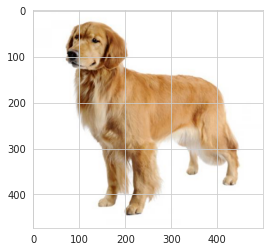

In [ ]:
#Mostramos el resultado
plt.imshow(imagen_resultado)
dfResultado